# 🐶 End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data


## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation


## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (this images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

In [1]:
# Unzip the uploaded data into Google Drive
#!unzip 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/dog-breed-identification.zip' -d 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/'

### Get our workspace ready

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Make sure we're using a GPU ✅

In [2]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print('TF version:', tf.__version__)
print('TF Hub version:', hub.__version__)

# Check for GPU availability
print('GPU', 'available (YES!!!)' if tf.config.list_physical_devices('GPU') else 'not available 😔')

TF version: 2.15.0
TF Hub version: 0.16.1
GPU available (YES!!!)


## Getting our data ready (turning it into Tensors)

With all machine learning models, our data has to be in numeric format. So that's we'll be doing first. Turning our images into Tensors (numerical representation).

Let's start by accessing our data and checking out the labels.

In [3]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv('drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

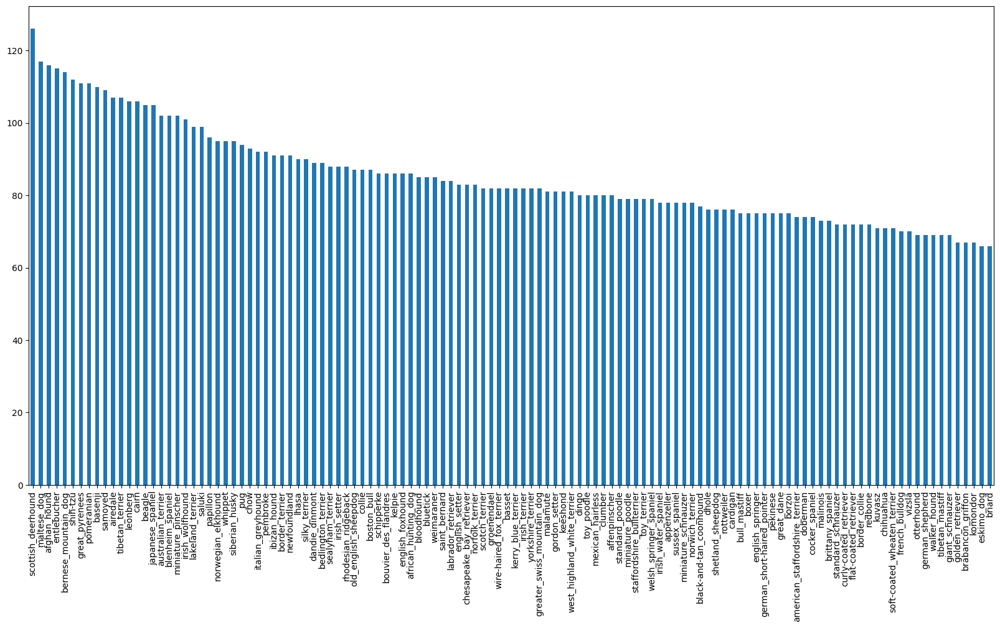

In [5]:
# How many images are there of each breed?
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [6]:
labels_csv['breed'].value_counts().median()

82.0

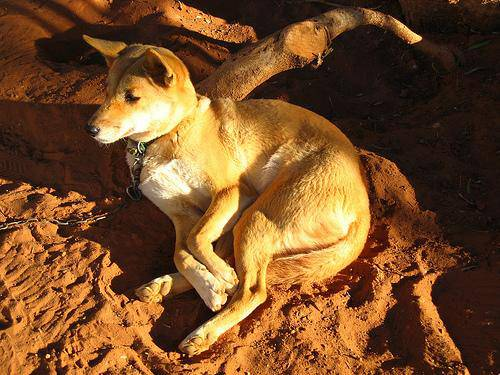

In [7]:
# Let's view an image
from IPython.display import Image
Image('drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

### Getting images and their labels

Let's get a list of all our image file path names.

In [8]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [9]:
# Create pathnames from image ID's.
filenames = ['drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/' + fname + '.jpg' for fname in labels_csv['id']]

# Check the first 10
filenames[:10]

['drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [10]:
import os
os.listdir('drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/')[:10]

['de3ee90f9042b3cdae9aa9f1867eb751.jpg',
 'dd1ec05369df96f7b53cf3a7db056e99.jpg',
 'e36f90b1dd7921dceb536c79989fe69f.jpg',
 'e993788050a70ef538c396f582c3a04c.jpg',
 'dc44465b8caedd8d06f52a7482036a02.jpg',
 'e593a51964b8dbf67e3a8724667c1102.jpg',
 'dbea4a468416494d088a8854218b099c.jpg',
 'e8d09f74216aeede7e77829e177de7c0.jpg',
 'e76ab0b6cd07a1583ef84a2d4dc98aca.jpg',
 'e5afb48f945656686984a28974cfca73.jpg']

In [11]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir('drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/')) == len(filenames):
  print('Filenames match actual amount of files!!! Proceed.')
else:
  print('Filenames do not match actual amount of files, check the target directory.')

Filenames match actual amount of files!!! Proceed.


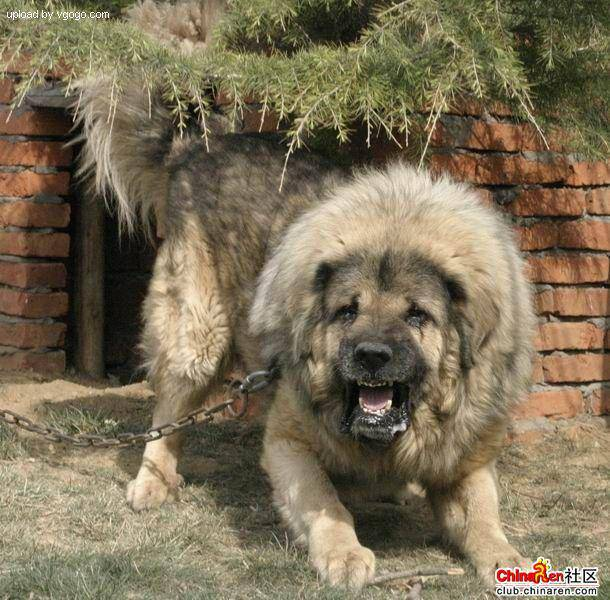

In [12]:
# One more check
Image(filenames[9000])

In [13]:
labels_csv['breed'][9000]

'tibetan_mastiff'

Since we've got our training image filepaths in a list, let's prepare our labels.

In [14]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [15]:
len(labels)

10222

In [16]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print('Number of labels matches number of filenames!')
else:
  print('Number of labels does not match number of filenames, check data directories!')

Number of labels matches number of filenames!


In [17]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [18]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [19]:
# Turn a single lable into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [20]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [21]:
len(boolean_labels)

10222

In [22]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [23]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [24]:
boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [25]:
filenames[:10]

['drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [26]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [27]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increase as needed.

In [28]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000, step:1000}

In [29]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [30]:
# Let's have a geez at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, F

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors, we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow ot read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our `image` (convert color channel from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

Before we do, let's see what importing an image looks like.

In [31]:
# Convert image to Numpy
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
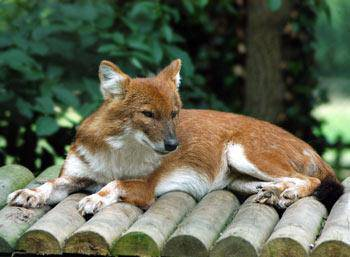

In [32]:
image

In [33]:
image.max(), image.min()

(255, 0)

In [34]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [35]:
# Turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seen what image looks like as a Tensor, let's make a function to preprocess them.

To preprocess our images into Tensors, we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow ot read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our `image` (convert color channel from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

In [36]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  '''
  Takes an image file plath and turns the image into a Tensor.
  '''
  # Read an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tesnor tuples which look like this:
`(image, label)`.

In [37]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  '''
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  '''
  image = process_image(image_path)
  return image, label

In [38]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data (`X` & `y`) into batches!

In [39]:
# Define a the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training dat but doesn't shuffle if it's validation data.
  Also accepts test data test data as input (no labels).
  '''
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                              tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # If the data is a train dataset, we need to shuffle it
  else:
    print('Creating training data batches...')
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))
    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)
    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [40]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [41]:
# Check out the different attributues of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however these can be a little hard to understand/comprehend. Let's visualize them!

In [42]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  '''
  Displays a plot of 25 images and their labels from a data batch
  '''

  # Setup figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 35 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis('off')

In [43]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

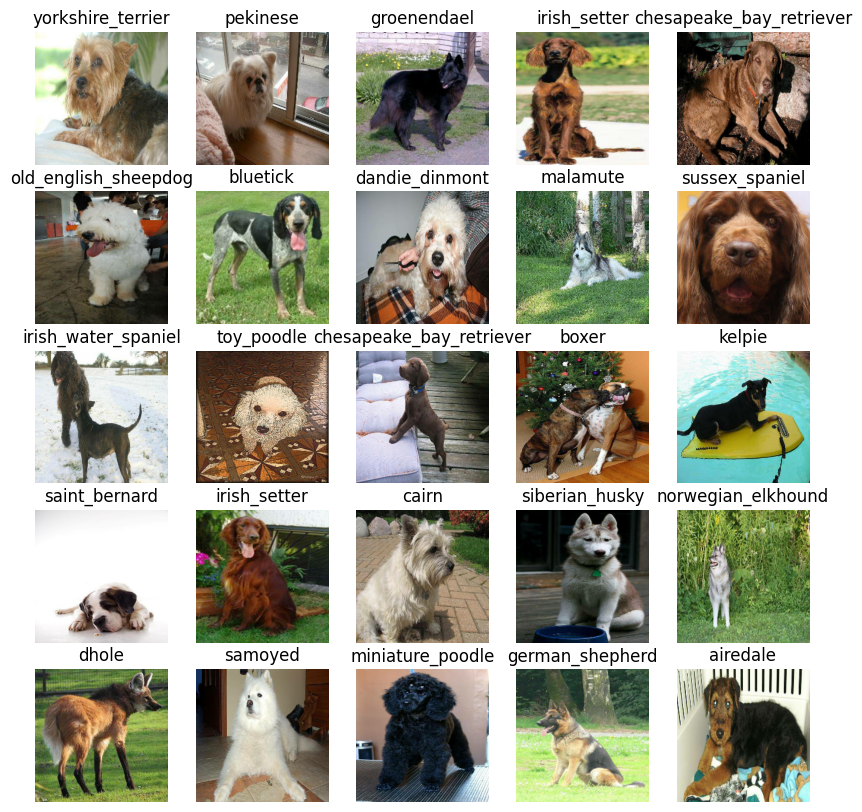

In [44]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

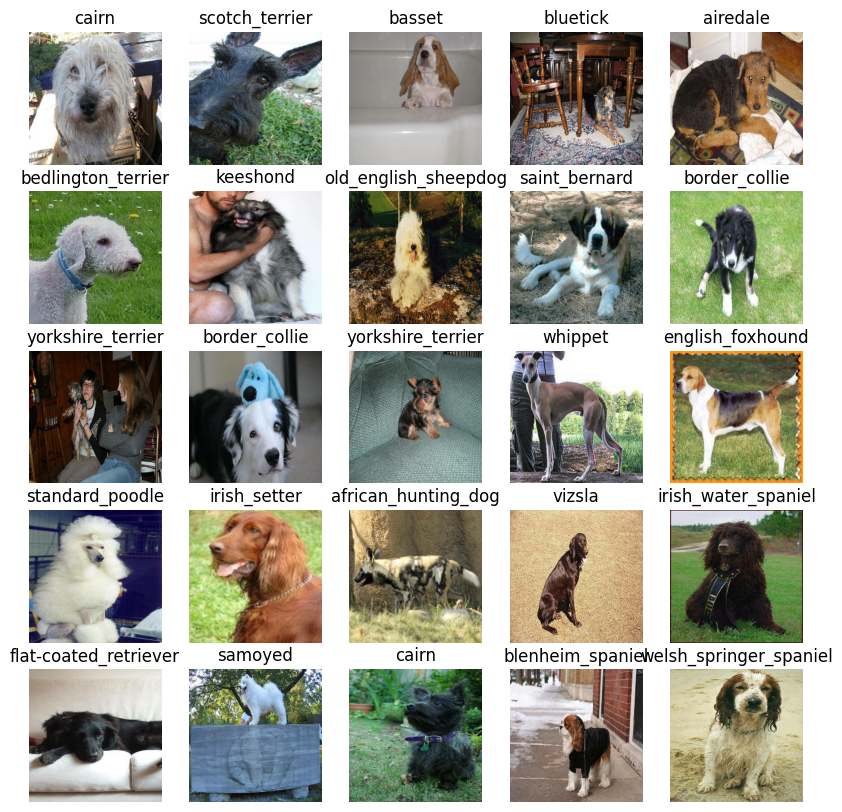

In [45]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image, labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub -

In [46]:
IMG_SIZE

224

In [47]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, widt, color channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
#MODEL_URL = 'https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4'
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4'

Now we've got our inputs, outputs, and model ready to go. Let's put them together into a Keras deep learning model!

Knowig this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these stesps can be found here: https://www.tensorflow.org/guide/keras

In [48]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with:', MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation='softmax') # Layer 2 (output layer)
      ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [49]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callback

Callbacks are helper functions a model can use during training to do such things such as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps tracks our model's progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To steup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function. ✅
3. Visulaize our model's training logs with the `%tensorboard` magic function (we'll do this after model training).

In [50]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [51]:
import datetime

# Create a function to build a TensorBoard callbackk
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join('drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/logs',
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime('%Y,%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metrics stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping



In [52]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [53]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100}

In [54]:
# Check to make sure we're still running on a GPU
print('GPU', 'availabe (YES!)' if tf.config.list_physical_devices('GPU') else 'not available 😔')

GPU availabe (YES!)


Let's create a function which trains a model

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbakcs we'd like to use
* Return the model

In [55]:
# Build a function to train and return a trained model
def train_model():
  '''
  Trains a given model and returns the trained version.
  '''
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [56]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 254s 10s/step - loss: 4.5455 - accuracy: 0.1125 - val_loss: 3.5394 - val_accuracy: 0.2200
Epoch 2/100
25/25 [==============================] - 8s 330ms/step - loss: 1.6008 - accuracy: 0.6925 - val_loss: 2.2916 - val_accuracy: 0.4600
Epoch 3/100
25/25 [==============================] - 5s 205ms/step - loss: 0.5678 - accuracy: 0.9350 - val_loss: 1.8068 - val_accuracy: 0.5350
Epoch 4/100
25/25 [==============================] - 7s 264ms/step - loss: 0.2548 - accuracy: 0.9900 - val_loss: 1.5933 - val_accuracy: 0.5700
Epoch 5/100
25/25 [==============================] - 4s 167ms/step - loss: 0.1467 - accuracy: 0.9937 - val_loss: 1.5168 - val_accuracy: 0.5650
Epoch 6/100
25/25 [==============================] - 5s 185ms/step - loss: 0.1001 - accuracy: 0.9987 - val_loss: 1.4801 - val_accuracy: 0.5750
Epoch 7/100
25/25 [==============================

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset. What are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with isa good thing! It means our model is learning!

### Checking the TensorBoard logs

The TensorBoard magice function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [57]:
%tensorboard --logdir drive/MyDrive/DATA\ SCIENCE/ZTM/Dog\ Vision/logs/

<IPython.core.display.Javascript object>

## Making and evaluatiing predictions using a trained model

In [58]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [59]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 8s 148ms/step


array([[7.1046490e-04, 1.2859730e-04, 8.8074366e-03, ..., 2.9666745e-04,
        2.9562769e-05, 1.2393156e-02],
       [1.8884592e-03, 2.8839495e-03, 2.5218879e-03, ..., 2.2538110e-04,
        8.1903161e-04, 1.5885776e-04],
       [4.7279777e-06, 4.3768683e-05, 4.5579425e-05, ..., 1.4208228e-05,
        1.3552622e-05, 1.4974999e-03],
       ...,
       [8.1847029e-06, 2.9192046e-05, 1.7807672e-04, ..., 6.8251640e-05,
        3.6191283e-05, 5.7221405e-05],
       [5.9894980e-03, 2.9416729e-04, 4.1216437e-04, ..., 2.5887735e-04,
        1.2901540e-04, 1.3658404e-02],
       [4.9429963e-04, 3.0374780e-05, 9.8462775e-04, ..., 1.2267383e-03,
        8.6394913e-04, 2.2269931e-05]], dtype=float32)

In [60]:
np.sum(predictions[0])

0.9999999

In [61]:
predictions[0]

array([7.1046490e-04, 1.2859730e-04, 8.8074366e-03, 2.4525807e-04,
       1.0390698e-03, 1.1551879e-05, 2.0420531e-02, 5.6133646e-04,
       2.1280485e-04, 3.4707598e-04, 5.9880491e-04, 2.1917098e-05,
       1.0217706e-03, 2.0336163e-04, 4.6547833e-03, 1.8572094e-04,
       1.2316459e-04, 1.2926713e-01, 2.9538955e-05, 4.1317213e-05,
       4.8930739e-04, 7.9866004e-05, 1.2933888e-05, 1.3103195e-03,
       3.6056972e-05, 1.7382958e-04, 2.6622319e-01, 1.2514197e-04,
       3.4958587e-03, 1.1185488e-04, 1.8615308e-04, 2.5779341e-04,
       1.7409388e-04, 2.3277025e-05, 6.3924432e-05, 5.4404885e-02,
       7.8149729e-05, 4.1026896e-04, 6.4773194e-05, 3.1638159e-05,
       1.3605814e-03, 2.2957685e-05, 9.5755880e-05, 1.0260065e-04,
       2.1348693e-05, 2.7288980e-04, 4.2084859e-05, 2.7014737e-04,
       6.0297031e-04, 1.5019013e-04, 1.7772077e-04, 4.0945593e-05,
       7.2889478e-04, 2.7324329e-05, 3.5789002e-05, 4.0760377e-05,
       8.3758896e-05, 2.7834759e-03, 2.3120400e-04, 1.2518758e

In [62]:
# First prediction
index = 42
print(predictions[0])
print(f'Max value (probability of predictions): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[7.1046490e-04 1.2859730e-04 8.8074366e-03 2.4525807e-04 1.0390698e-03
 1.1551879e-05 2.0420531e-02 5.6133646e-04 2.1280485e-04 3.4707598e-04
 5.9880491e-04 2.1917098e-05 1.0217706e-03 2.0336163e-04 4.6547833e-03
 1.8572094e-04 1.2316459e-04 1.2926713e-01 2.9538955e-05 4.1317213e-05
 4.8930739e-04 7.9866004e-05 1.2933888e-05 1.3103195e-03 3.6056972e-05
 1.7382958e-04 2.6622319e-01 1.2514197e-04 3.4958587e-03 1.1185488e-04
 1.8615308e-04 2.5779341e-04 1.7409388e-04 2.3277025e-05 6.3924432e-05
 5.4404885e-02 7.8149729e-05 4.1026896e-04 6.4773194e-05 3.1638159e-05
 1.3605814e-03 2.2957685e-05 9.5755880e-05 1.0260065e-04 2.1348693e-05
 2.7288980e-04 4.2084859e-05 2.7014737e-04 6.0297031e-04 1.5019013e-04
 1.7772077e-04 4.0945593e-05 7.2889478e-04 2.7324329e-05 3.5789002e-05
 4.0760377e-05 8.3758896e-05 2.7834759e-03 2.3120400e-04 1.2518758e-01
 1.0084278e-04 7.7202654e-05 1.9764272e-03 2.9235271e-05 2.8458951e-04
 1.7227871e-02 1.9858402e-04 7.1505684e-04 9.5495703e-03 2.8805662e-05
 3.155

In [63]:
unique_breeds[113]

'walker_hound'

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [64]:
# Turn prediction probabilities into their respective lable (easier to understand)
def get_pred_label(prediction_probabilities):
  '''
  Turns an array. ofprediction probabilities into a label
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Now since our validation data is still in a batch dataset, we'll have to 'unbatchify' it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [65]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [66]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  '''
  Takes a batch dataset of (image, label) Tensors and returns seperate arrays of images and labels.
  '''
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some functions to make these all a bit more visualize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label.✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [67]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  '''
  View the prediction, ground truth and image for sample n
  '''
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

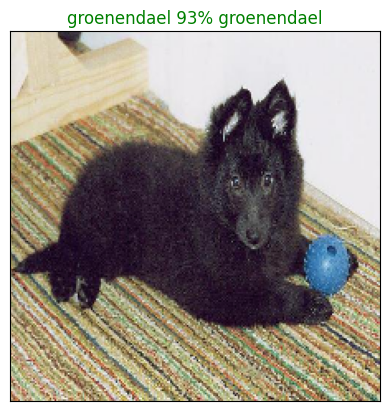

In [68]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've one function to visualize our models top prediction, let's make another to view our models top 10 predictions:

This functions will:
* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediction using `get_pred_label()`✅
* Find the top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediction labels ✅
* Plot the top 10 prediction probabilty values and labels, coloring the true label green ✅


In [69]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  '''
  Plot the top 10 highest prediction confidences along with the truth label for sample n.
  '''
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass


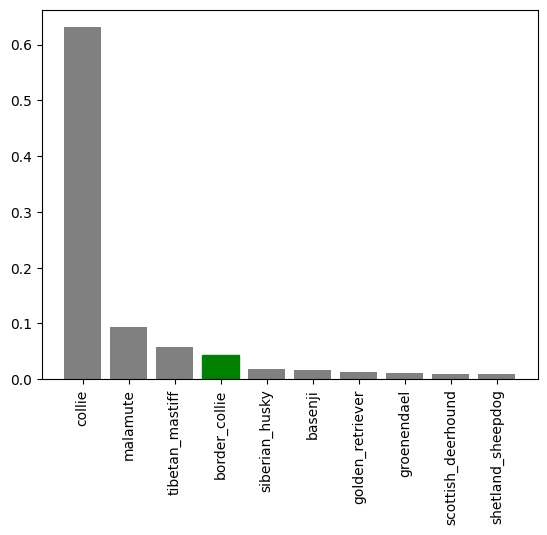

In [70]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out a few.

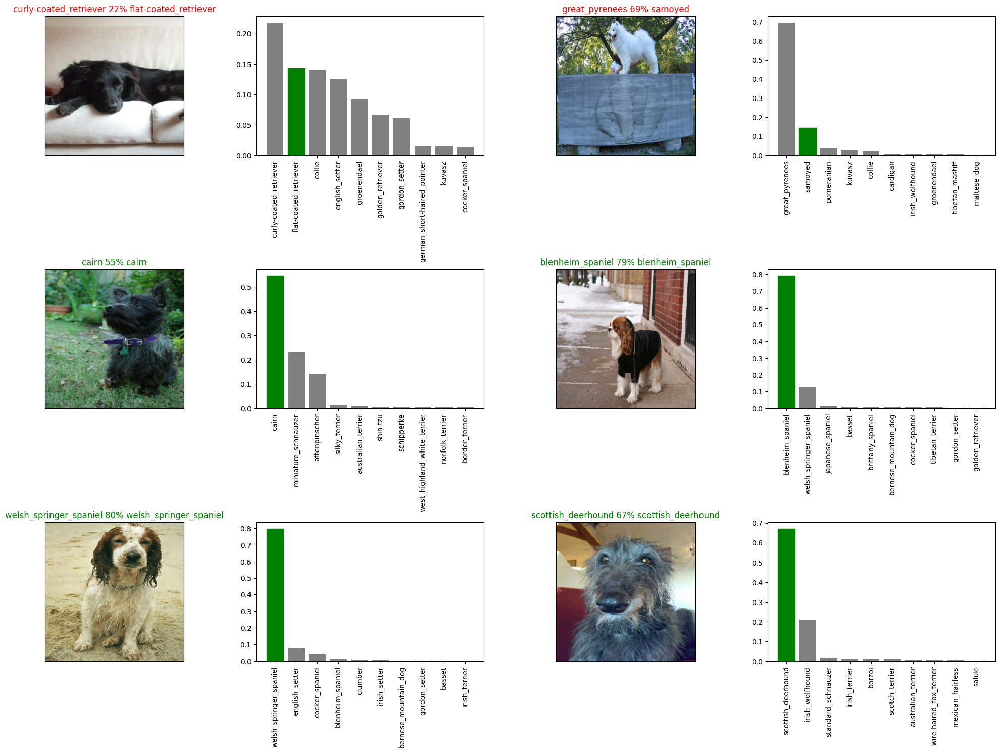

In [71]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge:** How would you create a confusion matrix with our models predictions and true labels?

## Saving and reloading a trained model

In [72]:
# Create a function to save a model
def save_model(model, suffix=None):
  '''
  Saves a given model in a model's directory and appends a suffix (string).
  '''
  # Create a model directory pathname with current time
  modeldir = os.path.join('drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/models',
                          datetime.datetime.now().strftime('%Y%m%D%d-%H%M%s'))
  model_path = modeldir + '-' + suffix + '.h5' # save format of model
  print(f'Saving model to: {model_path}...')
  model.save(model_path)
  return model_path

In [73]:
# Create a function to load a trained model
def load_model(model_path):
  '''
  Loads a saved model from a specified path
  '''
  print(f'Loading saved model from: {model_path}')
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={'KerasLayer':hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sue they work!

In [74]:
# Save our model trained on 1000 images
save_model(model, suffix='1000-images-mobilenetv2-Adam')

Saving model to: drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/models/20240303/29/2429-15381711726712-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/models/20240303/29/2429-15381711726712-1000-images-mobilenetv2-Adam.h5'

In [75]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/models/20240303/27/2427-01121711501924-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/models/20240303/27/2427-01121711501924-1000-images-mobilenetv2-Adam.h5


In [76]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 2s 238ms/step - loss: 1.3409 - accuracy: 0.6000


[1.3409068584442139, 0.6000000238418579]

In [77]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 168ms/step - loss: 1.3331 - accuracy: 0.6550


[1.3330879211425781, 0.6549999713897705]

## Training a big dog model 🐶 (on the full data)

In [79]:
len(X), len(y)

(10222, 10222)

In [80]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [81]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [82]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [83]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                            patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using  in the runtime has to load all of the images into memory.

In [84]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 50s 133ms/step - loss: 1.3391 - accuracy: 0.6652
Epoch 2/100
320/320 [==============================] - 41s 128ms/step - loss: 0.3946 - accuracy: 0.8842
Epoch 3/100
320/320 [==============================] - 41s 128ms/step - loss: 0.2380 - accuracy: 0.9338
Epoch 4/100
320/320 [==============================] - 47s 147ms/step - loss: 0.1527 - accuracy: 0.9639
Epoch 5/100
320/320 [==============================] - 49s 152ms/step - loss: 0.1043 - accuracy: 0.9797
Epoch 6/100
320/320 [==============================] - 55s 171ms/step - loss: 0.0798 - accuracy: 0.9866
Epoch 7/100
320/320 [==============================] - 52s 161ms/step - loss: 0.0584 - accuracy: 0.9913
Epoch 8/100
320/320 [==============================] - 40s 125ms/step - loss: 0.0474 - accuracy: 0.9931
Epoch 9/100
320/320 [==============================] - 41s 128ms/step - loss: 0.0360 - accuracy: 0.9961
Epoch 10/100
320/320 [==============================] - 41s 128m

In [87]:
# Save the full model
save_model(full_model, suffix='full-image-set-mobilenetv2-Adam')

Saving model to: drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/models/20240303/29/2429-16051711728350-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/models/20240303/29/2429-16051711728350-full-image-set-mobilenetv2-Adam.h5'

In [153]:
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/models/20240303/29/2429-16051711728350-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/models/20240303/29/2429-16051711728350-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily, we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames. ✅
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels). ✅
* Make a prediction array by passing the test batches to the `predict()` method called on our model. ✅

In [154]:
# Load test image filenames
test_path = 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/test/e00e5f7f822fd670bba314f87cce8428.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/test/ddf0164ab3a269b179051bdecaea34b0.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/test/e30a97eb637239e3b15c903529e04800.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/test/e4b8eb057df510fa776516de19c9fa92.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/test/e53cb5b42ea1a7700cd294a336890361.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/test/def9a16cb97a7cdd10d6465d642f6bf4.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/test/e2b4d6b6590fa2941e74238248093eb3.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/test/e0c11786a50ce49abdb71397d711ecc9.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/test/e008da6b957c62e7bcf6eb2ba4c2abd9.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/test/e66a91249a4979a86db48e5c64b81a88.jpg']

In [155]:
len(test_filenames)

10357

In [156]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [157]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to un (about an ~1hr)

In [158]:
# Make predictions on teste data batch using loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 161s 497ms/step


In [159]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt('drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/preds_array.csv', test_predictions, delimiter=',')

In [160]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt('drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/preds_array.csv', delimiter=',')

In [161]:
test_predictions[:10]

array([[1.37895043e-11, 7.86472883e-12, 1.07018422e-10, ...,
        3.98013178e-10, 9.05647410e-13, 1.91533150e-10],
       [1.75091259e-07, 8.97551811e-10, 3.57827105e-07, ...,
        2.94069075e-10, 2.52548307e-06, 9.81562510e-02],
       [2.84136535e-04, 1.87607552e-09, 1.28693489e-09, ...,
        1.53996567e-07, 8.31947497e-11, 3.18573730e-04],
       ...,
       [6.25830499e-11, 1.35575506e-08, 7.21724384e-13, ...,
        8.58517337e-12, 4.50014159e-09, 3.48868605e-04],
       [2.41674911e-08, 1.63551065e-11, 1.08501759e-08, ...,
        5.81369086e-08, 7.32985472e-06, 3.21083490e-07],
       [5.69533809e-10, 1.54165996e-08, 1.47330471e-13, ...,
        3.04506926e-08, 3.86510518e-10, 9.65296311e-13]])

In [162]:
test_predictions.shape

(10357, 120)

## Preparing teste dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog breed:

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get this data into this format,we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data tothe ID column by extracting the test image ID's from their fileplaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a csv to submit it to Kaggle.  

In [163]:
# ['id'] + list(unique_breeds)

In [164]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [165]:
test_filenames

['drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/test/e00e5f7f822fd670bba314f87cce8428.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/test/ddf0164ab3a269b179051bdecaea34b0.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/test/e30a97eb637239e3b15c903529e04800.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/test/e4b8eb057df510fa776516de19c9fa92.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/test/e53cb5b42ea1a7700cd294a336890361.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/test/def9a16cb97a7cdd10d6465d642f6bf4.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/test/e2b4d6b6590fa2941e74238248093eb3.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/test/e0c11786a50ce49abdb71397d711ecc9.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/test/e008da6b957c62e7bcf6eb2ba4c2abd9.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/test/e66a91249a4979a86db48e5c64b81a88.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/test/e73d52671c56e1507fed58c4c287d5f1.jpg',
 'drive/MyDrive/DATA SCIENCE/ZTM

In [166]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [167]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e00e5f7f822fd670bba314f87cce8428,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ddf0164ab3a269b179051bdecaea34b0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e30a97eb637239e3b15c903529e04800,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e4b8eb057df510fa776516de19c9fa92,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e53cb5b42ea1a7700cd294a336890361,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [168]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e00e5f7f822fd670bba314f87cce8428,1.378950e-11,7.864729e-12,1.070184e-10,5.999479e-08,5.760471e-12,1.268195e-09,9.542629e-11,2.985359e-12,3.546775e-10,...,5.360518e-12,1.926705e-10,8.449211e-10,5.207873e-09,1.248305e-09,2.790246e-11,2.182402e-09,3.980132e-10,9.056474e-13,1.915332e-10
1,ddf0164ab3a269b179051bdecaea34b0,1.750913e-07,8.975518e-10,3.578271e-07,1.016013e-11,1.990106e-07,4.734010e-13,7.164048e-02,6.490163e-08,2.491681e-09,...,2.808605e-08,2.930802e-06,4.850699e-11,8.048161e-11,5.038546e-10,1.653551e-07,9.247306e-05,2.940691e-10,2.525483e-06,9.815625e-02
2,e30a97eb637239e3b15c903529e04800,2.841365e-04,1.876076e-09,1.286935e-09,2.123122e-12,1.626817e-12,7.666672e-11,4.378931e-06,9.058496e-11,1.263782e-10,...,1.370423e-10,1.691366e-09,1.765281e-11,1.720181e-10,9.946407e-10,7.724851e-09,4.014096e-08,1.539966e-07,8.319475e-11,3.185737e-04
3,e4b8eb057df510fa776516de19c9fa92,6.490830e-10,1.625855e-12,5.597991e-16,2.542846e-13,5.093997e-12,3.243676e-13,5.205779e-14,2.894544e-12,5.411636e-14,...,2.794666e-10,9.005354e-14,1.337301e-11,6.620050e-14,8.961939e-13,7.849686e-13,3.582809e-13,2.923966e-15,1.447476e-12,4.228117e-12
4,e53cb5b42ea1a7700cd294a336890361,1.397216e-12,7.437756e-14,1.866047e-12,1.753627e-09,1.342516e-04,5.537649e-12,1.139648e-04,3.916511e-03,9.939337e-01,...,6.947693e-11,8.249783e-12,6.124343e-10,3.874157e-07,1.148677e-10,1.188278e-05,3.450514e-11,5.039889e-05,6.482645e-08,7.650751e-10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,083ee921f066ce08459cb978094fe2cb,4.204072e-07,5.637556e-05,2.623342e-09,3.860736e-11,3.501901e-12,1.635736e-12,3.900366e-14,3.801272e-11,1.816635e-06,...,7.110193e-12,9.486729e-12,1.251944e-09,6.335621e-13,7.710108e-09,5.670344e-11,3.574084e-12,8.472218e-11,1.477692e-10,1.717656e-09
10353,088106301addda7fc9f5a9bd6b79836f,8.838339e-10,3.157052e-09,3.614623e-06,1.982310e-05,4.030230e-08,3.331687e-10,7.641294e-09,5.800176e-09,5.444187e-10,...,2.229050e-10,2.007933e-07,1.879451e-08,6.980459e-09,2.002340e-09,9.078446e-10,1.547128e-10,1.735520e-09,6.765396e-09,4.763075e-09
10354,08db69ad154c401de7951c11a15ebf26,2.418125e-11,2.169714e-12,1.225346e-10,1.022825e-07,5.891253e-11,1.460451e-10,9.955437e-01,2.008529e-10,2.411504e-13,...,1.986859e-11,1.169891e-06,1.515362e-10,8.277626e-12,5.804680e-14,1.404360e-11,2.213744e-09,1.705971e-12,4.125716e-06,1.560348e-08
10355,0716352373a28d687d5df097512c5374,1.023192e-13,7.890576e-05,4.059096e-12,5.255649e-11,1.895202e-12,4.048045e-13,2.515630e-11,3.880095e-11,1.724122e-07,...,1.549486e-11,7.063721e-13,1.171812e-07,2.660123e-11,3.185530e-11,9.409699e-11,2.688761e-14,1.203905e-09,6.372847e-12,2.914985e-10


In [169]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv('drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv',
                index=False)

## Making predictions on custom images

To make predictions on customer images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [174]:
# Get custom image filepaths
custom_path = 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/my-dog-photos/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [175]:
custom_image_paths

['drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/my-dog-photos/dog-photo-2.jpeg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/my-dog-photos/dog-photo-1.jpeg',
 'drive/MyDrive/DATA SCIENCE/ZTM/Dog Vision/my-dog-photos/dog-photo-3.jpeg']

In [176]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [177]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)
custom_preds

1/1 [==============================] - 1s 858ms/step


array([[1.13767873e-09, 1.84975646e-11, 3.53895975e-11, 5.08490429e-12,
        2.59958000e-07, 1.60616451e-11, 4.06237461e-07, 5.39496796e-07,
        4.71387949e-07, 3.11902331e-05, 1.75073573e-08, 6.28059345e-14,
        3.84991795e-11, 3.37601225e-10, 1.49298884e-08, 3.75859587e-12,
        7.53846763e-10, 6.68897258e-07, 2.17494536e-10, 9.02045745e-13,
        1.14763329e-11, 6.39973363e-09, 1.42225187e-09, 8.09576711e-12,
        3.88371363e-10, 4.05023748e-08, 4.90935470e-09, 1.50920911e-07,
        4.39205721e-08, 4.87359193e-06, 6.45323406e-10, 1.10539880e-13,
        3.54558870e-05, 2.39909221e-11, 1.13260432e-08, 9.60143076e-11,
        4.62701329e-13, 2.67198584e-06, 1.49842985e-11, 1.04779851e-10,
        1.38238406e-07, 2.24591918e-06, 3.20462428e-12, 1.82556150e-07,
        4.74934225e-09, 1.45455905e-08, 6.44417505e-12, 5.65152725e-09,
        8.53975050e-12, 1.83781758e-01, 3.90227751e-06, 1.36494378e-07,
        1.66662595e-09, 3.09260240e-09, 1.73605094e-16, 4.625835

In [178]:
custom_preds.shape

(3, 120)

In [179]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['lakeland_terrier', 'golden_retriever', 'labrador_retriever']

In [180]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatches data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

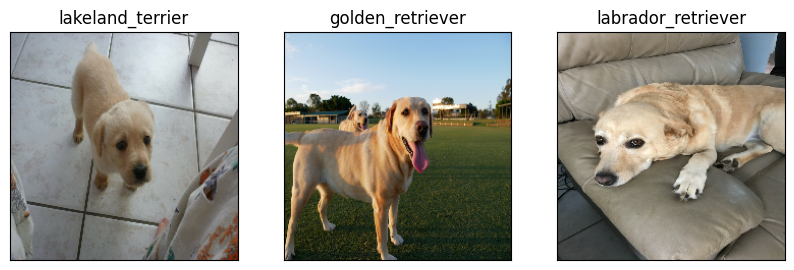

In [188]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)